# 12장. 텐서플로 라이트 소개

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://nbviewer.jupyter.org/github/rickiepark/aiml4coders/blob/main/ch12/12-tensorflow-lite.ipynb"><img src="https://jupyter.org/assets/share.png" width="61" />주피터 노트북 뷰어로 보기</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/rickiepark/aiml4coders/blob/main/ch12/12-tensorflow-lite.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />구글 코랩(Colab)에서 실행하기</a>
  </td>
</table>

## 훈련된 모델을 텐서플로 라이트로 변환하기

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
l0 = Dense(units=1, input_shape=[1])
model = Sequential([l0])
model.compile(optimizer='sgd', loss='mean_squared_error')

xs = np.array([-1.0, 0.0, 1.0, 2.0, 3.0, 4.0], dtype=float)
ys = np.array([-3.0, -1.0, 1.0, 3.0, 5.0, 7.0], dtype=float)

model.fit(xs, ys, epochs=500)

Epoch 1/500


2023-01-06 23:54:17.530693: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-06 23:54:17.542625: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-06 23:54:17.544305: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-06 23:54:17.547291: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

1/1 [==============================] - 1s 1s/step - loss: 53.1065
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 42.1874
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 33.5885
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 26.8151
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 21.4781
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 17.2714
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 13.9541
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 11.3367
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 9.2701
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 7.6370
Epoch 11/500
1/1 [==============================] - 0s 5ms/step - loss: 6.3450
Epoch 12/500
1/1 [==============================] - 0s 4ms/step - loss: 5.3217
Epoch 13/500
1/1 [==============================] - 0s 5ms/step - 

In [ ]:
print(model.predict([10.0]))
print("학습된 가중치: {}".format(l0.get_weights()))

1/1 [==============================] - 0s 77ms/step
[[18.97613]]
학습된 가중치: [array([[1.9965405]], dtype=float32), array([-0.9892744], dtype=float32)]


### 단계 1. 모델 저장하기

In [ ]:
export_dir = 'saved_model/1'
model.export(export_dir)

INFO:tensorflow:Assets written to: saved_model/1/assets


### 단계 2. 모델 변환하기

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)
tflite_model = converter.convert()

2023-01-06 23:54:22.953841: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2023-01-06 23:54:22.953876: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2023-01-06 23:54:22.954527: I tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: saved_model/1
2023-01-06 23:54:22.955159: I tensorflow/cc/saved_model/reader.cc:81] Reading meta graph with tags { serve }
2023-01-06 23:54:22.955184: I tensorflow/cc/saved_model/reader.cc:122] Reading SavedModel debug info (if present) from: saved_model/1
2023-01-06 23:54:22.957223: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled
2023-01-06 23:54:22.957647: I tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2023-01-06 23:54:22.978776: I tensorflow/cc/saved_model/loader.cc:212] Running initialization op on SavedModel bundle at path: saved_model/1
2023-01-06 23:54

In [ ]:
import pathlib
tflite_model_file = pathlib.Path('model.tflite')
tflite_model_file.write_bytes(tflite_model)

1052

### 단계 3. TFLite 모델 로드하고 텐서 할당하기

In [ ]:
interpreter = tf.lite.Interpreter(model_content=tflite_model)
interpreter.allocate_tensors()

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [ ]:
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print(input_details)
print(output_details)

[{'name': 'serving_default_dense_input:0', 'index': 0, 'shape': array([1, 1], dtype=int32), 'shape_signature': array([-1,  1], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
[{'name': 'StatefulPartitionedCall:0', 'index': 3, 'shape': array([1, 1], dtype=int32), 'shape_signature': array([-1,  1], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


In [ ]:
to_predict = np.array([[10.0]], dtype=np.float32)
print(to_predict)

[[10.]]


### 단계 4. 예측 수행하기

In [ ]:
interpreter.set_tensor(input_details[0]['index'], to_predict)
interpreter.invoke()

In [ ]:
tflite_results = interpreter.get_tensor(output_details[0]['index'])
print(tflite_results)

[[18.976131]]


## 전이 학습으로 만든 이미지 분류기를 텐서플로 라이트로 변환하기

### 단계 1. 모델 만들고 저장하기

In [ ]:
import matplotlib.pylab as plt
import tensorflow_hub as hub
import tensorflow_datasets as tfds

def format_image(image, label):
    image = tf.image.resize(image, (224, 224)) / 255.0
    return  image, label

# cats_vs_dogs 데이터 다운로드에 에러가 발생하면 다음 주석을 해제하고 실행하세요.
# (https://github.com/tensorflow/datasets/issues/3918)
# setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

num_examples = metadata.splits['train'].num_examples
num_classes = metadata.features['label'].num_classes
print(num_examples)
print(num_classes)

BATCH_SIZE = 32
train_batches = raw_train.shuffle(num_examples // 4).map(format_image).batch(BATCH_SIZE).prefetch(1)
validation_batches = raw_validation.map(format_image).batch(BATCH_SIZE).prefetch(1)
test_batches = raw_test.map(format_image).batch(1)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /home/jupyter/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteFLKWL5/cats_vs_dogs-train.tfrecord*..…

Dataset cats_vs_dogs downloaded and prepared to /home/jupyter/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.
23262
2


In [ ]:
handle_base, pixels, FV_SIZE = ("mobilenet_v2", 224, 1280)
MODULE_HANDLE ="https://tfhub.dev/google/tf2-preview/{}/feature_vector/4".format(handle_base)
IMAGE_SIZE = (pixels, pixels)
feature_extractor = hub.KerasLayer(MODULE_HANDLE,
                                   input_shape=IMAGE_SIZE + (3,),
                                   output_shape=[FV_SIZE],
                                   trainable=False)

In [ ]:
model = tf.keras.Sequential([
            feature_extractor,
            tf.keras.layers.Dense(num_classes, activation='softmax')
        ])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

hist = model.fit(train_batches,
                 epochs=5,
                 validation_data=validation_batches)

Epoch 1/5


2023-01-06 23:54:53.933399: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8200


 17/582 [..............................] - ETA: 18s - loss: 0.3205 - accuracy: 0.8621

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


 49/582 [=>............................] - ETA: 17s - loss: 0.1639 - accuracy: 0.9420

 59/582 [==>...........................] - ETA: 17s - loss: 0.1473 - accuracy: 0.9486

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


131/582 [=====>........................] - ETA: 14s - loss: 0.0958 - accuracy: 0.9671

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


341/582 [================>.............] - ETA: 8s - loss: 0.0692 - accuracy: 0.9773

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


353/582 [=================>............] - ETA: 7s - loss: 0.0686 - accuracy: 0.9776

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


363/582 [=================>............] - ETA: 7s - loss: 0.0673 - accuracy: 0.9780

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


391/582 [===================>..........] - ETA: 6s - loss: 0.0649 - accuracy: 0.9785

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.0544 - accuracy: 0.9817

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 30s 40ms/step - loss: 0.0544 - accuracy: 0.9817 - val_loss: 0.0371 - val_accuracy: 0.9867
Epoch 2/5
 17/582 [..............................] - ETA: 20s - loss: 0.0410 - accuracy: 0.9853

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


 49/582 [=>............................] - ETA: 18s - loss: 0.0360 - accuracy: 0.9860

 59/582 [==>...........................] - ETA: 17s - loss: 0.0352 - accuracy: 0.9868

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


131/582 [=====>........................] - ETA: 15s - loss: 0.0282 - accuracy: 0.9888

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


341/582 [================>.............] - ETA: 8s - loss: 0.0296 - accuracy: 0.9894

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


353/582 [=================>............] - ETA: 7s - loss: 0.0298 - accuracy: 0.9893

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


363/582 [=================>............] - ETA: 7s - loss: 0.0305 - accuracy: 0.9890

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


391/582 [===================>..........] - ETA: 6s - loss: 0.0297 - accuracy: 0.9891

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


397/582 [===================>..........] - ETA: 6s - loss: 0.0296 - accuracy: 0.9891

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0303 - accuracy: 0.9888

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 25s 38ms/step - loss: 0.0303 - accuracy: 0.9888 - val_loss: 0.0403 - val_accuracy: 0.9867
Epoch 3/5
 17/582 [..............................] - ETA: 20s - loss: 0.0389 - accuracy: 0.9853

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


 49/582 [=>............................] - ETA: 18s - loss: 0.0324 - accuracy: 0.9866

 59/582 [==>...........................] - ETA: 17s - loss: 0.0286 - accuracy: 0.9883

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


131/582 [=====>........................] - ETA: 15s - loss: 0.0305 - accuracy: 0.9897

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


341/582 [================>.............] - ETA: 8s - loss: 0.0272 - accuracy: 0.9909

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


353/582 [=================>............] - ETA: 7s - loss: 0.0267 - accuracy: 0.9911

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


363/582 [=================>............] - ETA: 7s - loss: 0.0266 - accuracy: 0.9910

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


391/582 [===================>..........] - ETA: 6s - loss: 0.0271 - accuracy: 0.9908

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


397/582 [===================>..........] - ETA: 6s - loss: 0.0270 - accuracy: 0.9907

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0248 - accuracy: 0.9914

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 25s 38ms/step - loss: 0.0248 - accuracy: 0.9914 - val_loss: 0.0342 - val_accuracy: 0.9884
Epoch 4/5
 17/582 [..............................] - ETA: 20s - loss: 0.0339 - accuracy: 0.9926

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


 49/582 [=>............................] - ETA: 18s - loss: 0.0212 - accuracy: 0.9930

 59/582 [==>...........................] - ETA: 18s - loss: 0.0198 - accuracy: 0.9931

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


131/582 [=====>........................] - ETA: 15s - loss: 0.0205 - accuracy: 0.9931

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


341/582 [================>.............] - ETA: 8s - loss: 0.0234 - accuracy: 0.9920

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


353/582 [=================>............] - ETA: 7s - loss: 0.0236 - accuracy: 0.9919

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


363/582 [=================>............] - ETA: 7s - loss: 0.0233 - accuracy: 0.9921

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


391/582 [===================>..........] - ETA: 6s - loss: 0.0229 - accuracy: 0.9920

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


397/582 [===================>..........] - ETA: 6s - loss: 0.0229 - accuracy: 0.9919

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0216 - accuracy: 0.9923

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 25s 38ms/step - loss: 0.0218 - accuracy: 0.9923 - val_loss: 0.0392 - val_accuracy: 0.9884
Epoch 5/5
 17/582 [..............................] - ETA: 20s - loss: 0.0333 - accuracy: 0.9908

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


 49/582 [=>............................] - ETA: 18s - loss: 0.0257 - accuracy: 0.9923

 59/582 [==>...........................] - ETA: 17s - loss: 0.0231 - accuracy: 0.9926

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


131/582 [=====>........................] - ETA: 15s - loss: 0.0189 - accuracy: 0.9943

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


341/582 [================>.............] - ETA: 8s - loss: 0.0206 - accuracy: 0.9931

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


353/582 [=================>............] - ETA: 7s - loss: 0.0208 - accuracy: 0.9933

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


363/582 [=================>............] - ETA: 7s - loss: 0.0204 - accuracy: 0.9935

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


391/582 [===================>..........] - ETA: 6s - loss: 0.0197 - accuracy: 0.9937

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0187 - accuracy: 0.9937

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 24s 38ms/step - loss: 0.0187 - accuracy: 0.9937 - val_loss: 0.0395 - val_accuracy: 0.9871


In [ ]:
CATS_VS_DOGS_SAVED_MODEL = "exp_saved_model"
model.export(CATS_VS_DOGS_SAVED_MODEL)

INFO:tensorflow:Assets written to: exp_saved_model/assets


INFO:tensorflow:Assets written to: exp_saved_model/assets


### 단계 2. 텐서플로 라이트로 모델 변환하기

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(CATS_VS_DOGS_SAVED_MODEL)
tflite_model = converter.convert()
tflite_model_file = 'converted_model.tflite'

with open(tflite_model_file, "wb") as f:
    f.write(tflite_model)

2023-01-06 23:57:04.500713: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2023-01-06 23:57:04.500767: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2023-01-06 23:57:04.500937: I tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: exp_saved_model
2023-01-06 23:57:04.513985: I tensorflow/cc/saved_model/reader.cc:81] Reading meta graph with tags { serve }
2023-01-06 23:57:04.514019: I tensorflow/cc/saved_model/reader.cc:122] Reading SavedModel debug info (if present) from: exp_saved_model
2023-01-06 23:57:04.561857: I tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2023-01-06 23:57:05.005786: I tensorflow/cc/saved_model/loader.cc:212] Running initialization op on SavedModel bundle at path: exp_saved_model
2023-01-06 23:57:05.183854: I tensorflow/cc/saved_model/loader.cc:301] SavedModel load for tags { serve }; Status: success: OK. Took 682917 mic

In [ ]:
interpreter = tf.lite.Interpreter(model_path=tflite_model_file)
interpreter.allocate_tensors()

input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

predictions = []

In [ ]:
test_labels, test_imgs = [], []
for img, label in test_batches.take(100):
    interpreter.set_tensor(input_index, img)
    interpreter.invoke()
    predictions.append(interpreter.get_tensor(output_index))
    test_labels.append(label.numpy()[0])
    test_imgs.append(img)

In [ ]:
score = 0
for item in range(0,99):
    prediction=np.argmax(predictions[item])
    label = test_labels[item]
    if prediction==label:
        score=score+1

print("100개 중 맞은 예측 수: " + str(score))

100개 중 맞은 예측 수: 99


In [ ]:
class_names = ['cat', 'dog']

def plot_image(i, predictions_array, true_label, img):
    predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = np.squeeze(img)

    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(predictions_array)

    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                         100*np.max(predictions_array),
                                         class_names[true_label]), color=color)

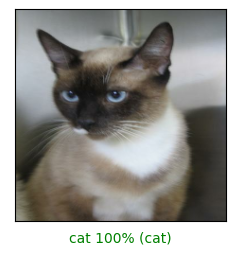

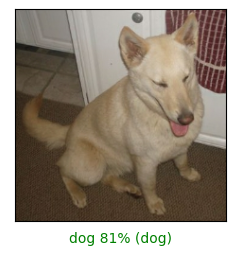

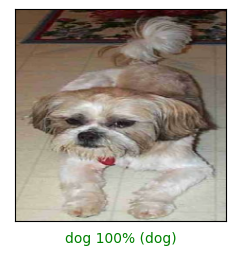

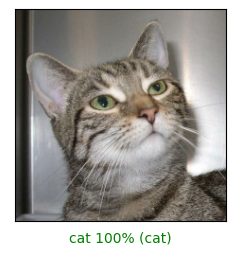

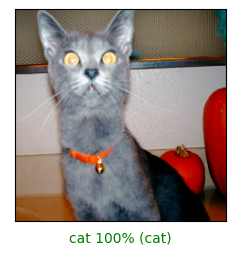

...

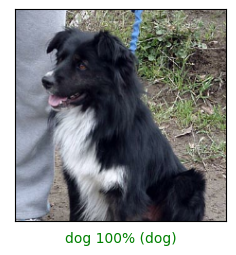

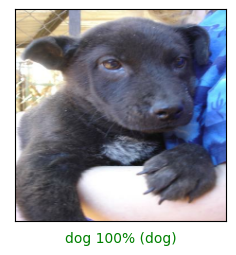

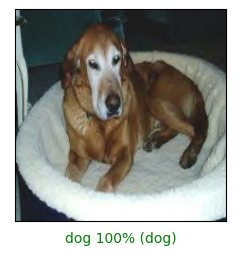

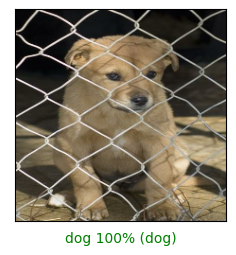

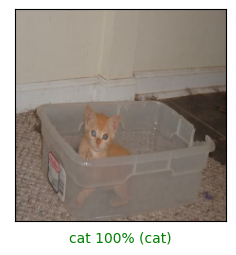

In [ ]:
for index in range(0,99):
    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plot_image(index, predictions, test_labels, test_imgs)
    plt.show()

### 단계 3. 모델 최적화하기

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(CATS_VS_DOGS_SAVED_MODEL)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()
tflite_model_file = 'converted_model.tflite'
with open(tflite_model_file, "wb") as f:
    f.write(tflite_model)

2023-01-06 23:57:22.061997: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2023-01-06 23:57:22.062055: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2023-01-06 23:57:22.062217: I tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: exp_saved_model
2023-01-06 23:57:22.075211: I tensorflow/cc/saved_model/reader.cc:81] Reading meta graph with tags { serve }
2023-01-06 23:57:22.075244: I tensorflow/cc/saved_model/reader.cc:122] Reading SavedModel debug info (if present) from: exp_saved_model
2023-01-06 23:57:22.123272: I tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2023-01-06 23:57:22.561608: I tensorflow/cc/saved_model/loader.cc:212] Running initialization op on SavedModel bundle at path: exp_saved_model
2023-01-06 23:57:22.743232: I tensorflow/cc/saved_model/loader.cc:301] SavedModel load for tags { serve }; Status: success: OK. Took 681015 mic

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(CATS_VS_DOGS_SAVED_MODEL)

converter.optimizations = [tf.lite.Optimize.DEFAULT]

def representative_data_gen():
    for input_value, _ in test_batches.take(100):
        yield [input_value]

converter.representative_dataset = representative_data_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]

tflite_model = converter.convert()
tflite_model_file = 'converted_model.tflite'

with open(tflite_model_file, "wb") as f:
    f.write(tflite_model)

2023-01-06 23:57:26.772534: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2023-01-06 23:57:26.772589: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2023-01-06 23:57:26.772750: I tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: exp_saved_model
2023-01-06 23:57:26.786051: I tensorflow/cc/saved_model/reader.cc:81] Reading meta graph with tags { serve }
2023-01-06 23:57:26.786084: I tensorflow/cc/saved_model/reader.cc:122] Reading SavedModel debug info (if present) from: exp_saved_model
2023-01-06 23:57:26.834237: I tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2023-01-06 23:57:27.280606: I tensorflow/cc/saved_model/loader.cc:212] Running initialization op on SavedModel bundle at path: exp_saved_model
2023-01-06 23:57:27.461964: I tensorflow/cc/saved_model/loader.cc:301] SavedModel load for tags { serve }; Status: success: OK. Took 689214 mic